# Feature Map Visualization

## Import libraries

In [1]:
import numpy as np
import cv2
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import segmentation_models as sm

sm.set_framework('tf.keras')

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams['figure.dpi'] = 600
plt.rcParams["font.weight"] = "bold"
plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

Segmentation Models: using `keras` framework.


## Global params

In [2]:
backbone = 'efficientnetb4'
shape = 224
preprocess_input = sm.get_preprocessing(backbone)
model_path = '../data/model/unet_model'
img_path = '../data/image_and_masks/train_imgs/train/IMG_20220426_132232945.png'

## Get model

In [3]:
model = sm.Unet(backbone, input_shape = (shape, shape, 3), classes = 1, activation = 'sigmoid')
model.load_weights(model_path).expect_partial()

In [4]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 stem_conv (Conv2D)             (None, 112, 112, 48  1296        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 stem_bn (BatchNormalization)   (None, 112, 112, 48  192         ['stem_conv[0][0]']              
                                )                                                             

## Load image

In [5]:
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (shape, shape), interpolation = cv2.INTER_NEAREST_EXACT)
img_array = np.expand_dims(img, axis=0)

## Get features

In [6]:
layer_output = model.get_layer('decoder_stage4a_conv').output

In [7]:
feature_map_model = tf.keras.models.Model(model.input, layer_output)

In [8]:
feature_map = feature_map_model.predict(img_array)

In [9]:
k = feature_map.shape[-1]
size=feature_map.shape[1]

images = []

for i in range(k):
    feature_image = feature_map[0, :, :, i]
    feature_image-= feature_image.mean()
    feature_image/= feature_image.std ()
    feature_image*=  64
    feature_image+= 128
    feature_image= np.clip(feature_image, 0, 255).astype('uint8')
    feature_image = cv2.resize(feature_image, (3264, 1836), interpolation = cv2.INTER_NEAREST_EXACT)
    images.append(feature_image)

## Plot images

(-0.5, 3263.5, 1835.5, -0.5)

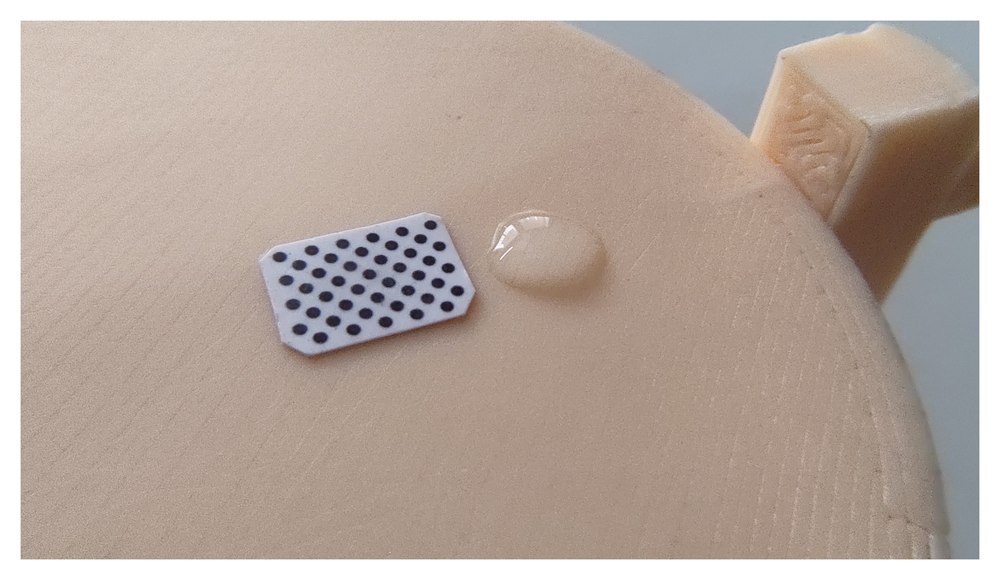

In [10]:
orig = cv2.imread(img_path)
plt.imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB))
plt.axis('off')

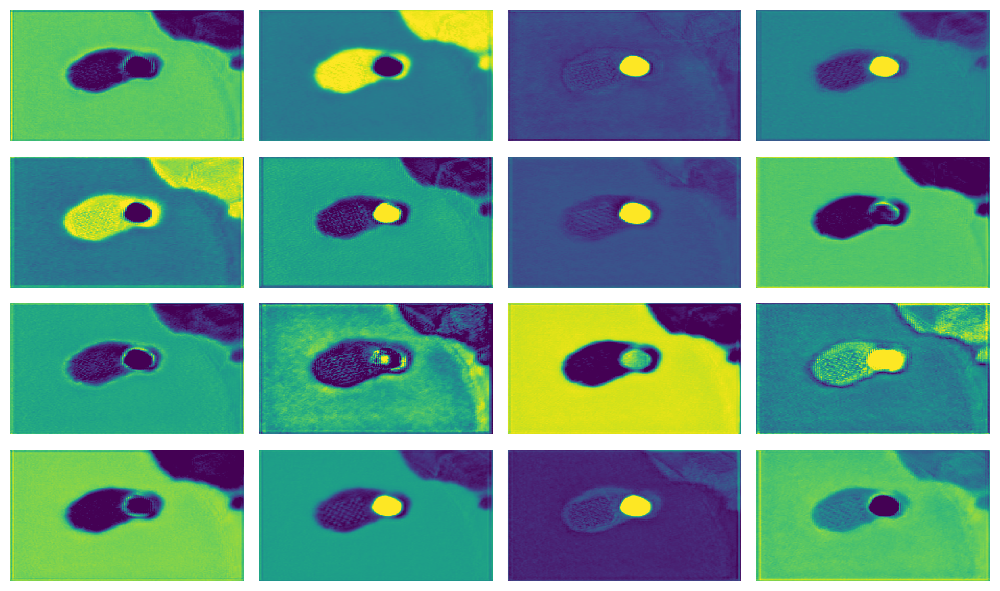

In [11]:
fig, axs = plt.subplots(4, 4, figsize=(10,6)) 

for i in range(k):
    axs[i//4, i%4].imshow(images[i])
    axs[i//4, i%4].axis('off')

plt.tight_layout()
plt.show()